In [1]:
!nvidia-smi

Mon Nov  2 18:18:19 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.32.00    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   65C    P0    31W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import pandas as pd
import numpy as np
import cv2
import os
import re

from PIL import Image

import albumentations as A
from albumentations.pytorch.transforms import ToTensor
import torch
import torchvision

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

from torch.utils.data import DataLoader, Dataset
from torch.utils.data.sampler import SequentialSampler

from matplotlib import pyplot as plt

DIR_INPUT = '/content/drive/My Drive/'
train_df = pd.read_csv(DIR_INPUT + "train_data.csv")
DIR_TRAIN = f'{DIR_INPUT}/test_resized'
train_df=train_df.rename(columns={"index": "image"})

In [4]:
train_df.drop_duplicates(subset =['image', 'box','class'], 
                     keep = 'first', inplace = True) 

In [5]:
train_df['x'] = -1
train_df['y'] = -1
train_df['w'] = -1
train_df['h'] = -1

def expand_bbox(x):
    r = np.array(re.findall("([0-9]+[.]?[0-9]*)", x))
    if len(r) == 0:
        r = [-1, -1, -1, -1]
    return r

train_df[['x', 'y', 'w', 'h']] = np.stack(train_df['box'].apply(lambda x: expand_bbox(x)))
train_df.drop(columns=['box'], inplace=True)
train_df['x'] = train_df['x'].astype(np.int32)
train_df['y'] = train_df['y'].astype(np.int32)
train_df['w'] = train_df['w'].astype(np.int32)
train_df['h'] = train_df['h'].astype(np.int32)

In [6]:
image_ids = train_df['image'].unique()
train_ids = image_ids[:150]
valid_ids = image_ids[150:]
valid_df = train_df[train_df['image'].isin(valid_ids)]
train_df = train_df[train_df['image'].isin(train_ids)]

In [7]:
train_df

,image,class,x,y,w,h
0,disc21.jpg,disc,94,132,162,197
1,disc28.jpg,disc,63,144,152,212
2,horseshoe34.jpg,hs,48,33,207,146
3,horseshoe28.jpg,hs,37,33,189,151
4,bird6.jpg,bird,12,56,187,160
...,...,...,...,...,...,...
160,disc44.jpg,disc,1,43,116,139
161,horseshoe60.jpg,hs,68,93,197,195
162,horseshoe3.jpg,hs,42,33,158,213
163,bird45.jpg,bird,78,102,126,137


In [8]:
class TrainDataset(Dataset):
    def __init__(self, dataframe, image_dir, transforms=None):
        super().__init__()

        self.image_ids = dataframe['image'].unique()
        self.df = dataframe
        self.image_dir = image_dir
        self.transforms = transforms

    def __getitem__(self, index: int):

        image_id = self.image_ids[index]
        records = self.df[self.df['image'] == image_id]
        image = cv2.imread(f'{self.image_dir}/{image_id}', cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0
        boxes = records[['x', 'y', 'w', 'h']].values
        if records['class'].iloc[0]=='disc':
          labels = torch.ones((records.shape[0],), dtype=torch.int64)  # This is for label, as we have only 1 class, it is always 1
        elif records['class'].iloc[0]=='bird':
          labels = torch.ones((records.shape[0],), dtype=torch.int64)*2
        elif records['class'].iloc[0]=='hs':
          labels = torch.ones((records.shape[0],), dtype=torch.int64)*3
        target = {}
        target['boxes'] = boxes
        target['labels'] = labels

        if self.transforms:
            sample = {
                'image': image,
                'bboxes': target['boxes'],
                'labels': labels
            }
            sample = self.transforms(**sample)
            image = sample['image']
            target['boxes'] = torch.stack(tuple(map(torch.tensor, zip(*sample['bboxes'])))).permute(1, 0)

        return image, target,image_id

    def __len__(self) -> int:
        return self.image_ids.shape[0]

In [22]:

class TestDataset(Dataset):
    def __init__(self, image_dir, transforms=None):
        super().__init__()
        self.image_list = sorted(os.listdir(image_dir))
        self.image_dir = image_dir
        self.transforms = transforms

    def __len__(self) -> int:
        return len(self.image_list)

    def __getitem__(self, index: int):
        image_id = self.image_list[index]
        image = cv2.imread(f'{self.image_dir}/{image_id}', cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0
        if 'disc' in image_id:
          label = 1 
        elif 'bird' in image_id:
          label = 2 
        elif 'horseshoe' in image_id:
          label = 3
        else: 
          label=0
        if self.transforms:
            sample = {
                'image': image,
            }
            sample = self.transforms(**sample)
            image = sample['image']

        return image,label


In [23]:
def get_train_transform():
    return A.Compose([
        ToTensor()
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

def get_valid_transform():
    return A.Compose([
        ToTensor()
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

def test_transform():
    return A.Compose([A.Resize(256, 256), ToTensor()])

In [24]:
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

In [25]:
def collate_fn(batch):
    return tuple(zip(*batch))

train_dataset = TrainDataset(train_df, DIR_TRAIN, get_train_transform())
valid_dataset = TrainDataset(valid_df, DIR_TRAIN, get_valid_transform())
test_dataset =  TestDataset('/content/drive/My Drive/testtest', test_transform())

indices = torch.randperm(len(train_dataset)).tolist()

train_data_loader = DataLoader(
    train_dataset,
    batch_size=8,
    shuffle=True,
    num_workers=4,
    collate_fn=collate_fn
)

valid_data_loader = DataLoader(
    valid_dataset,
    batch_size=8,
    shuffle=True,
    num_workers=4,
    collate_fn=collate_fn
)

test_data_loader = DataLoader(
    test_dataset,
    batch_size=36,
    shuffle=False,
    num_workers=4
)


In [13]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

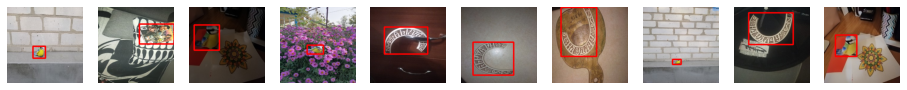

In [18]:
images, targets = next(iter(train_data_loader))
images = list(image.to(device) for image in images)
targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
fig, ax = plt.subplots(1, batch, figsize=(16, 10))
for i in range(len(images)):
  boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
  sample = images[i].permute(1,2,0).cpu().numpy()
  for box in boxes:
      cv2.rectangle(sample,
                    (box[0], box[1]),
                    (box[2], box[3]),
                    (220, 0, 0), 3)
      
  ax[i].set_axis_off()
  ax[i].imshow(sample)

In [19]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
num_classes = 4
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

def train_model(model_conv,train_loader, valid_loader, optimizer, criterion, num_epochs, scheduler):
  loss_hist = criterion
  for epoch in range(num_epochs):
      loss_hist.reset()
      print(f"Epoch #{epoch} starts")
      for images, targets in train_loader:
          
          images = list(image.to(device)for image in images)
          targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
          loss_dict = model_conv(images, targets)

          losses = sum(loss for loss in loss_dict.values())
          loss_value = losses.item()
          loss_hist.send(loss_value)

          optimizer.zero_grad()
          losses.backward()
          optimizer.step()
      val_loss = []
      for images, targets  in valid_loader:
          images = list(image.to(device)for image in images)
          targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
          loss_dict = model_conv(images, targets)
          losses = sum(loss for loss in loss_dict.values())
          loss_value = losses.item()
          val_loss.append(loss_value)

      scheduler.step()
      torch.save(model.state_dict(), '/content/drive/My Drive/faser_rcnn_weights/model_fasterrcnn_resnet50_weights.pt')

      print(f"Epoch #{epoch} Train_loss: {loss_hist.value}, Val_loss: {loss_value}") 

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


In [20]:
model.to(device)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
n_epochs = 40
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[20,35], gamma=0.1)
train_model(model,train_data_loader, valid_data_loader, optimizer, Averager(), n_epochs, scheduler)

Epoch #0 starts


/usr/local/lib/python3.6/dist-packages/torchvision/ops/boxes.py:101: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  keep = keep.nonzero().squeeze(1)


Epoch #0 Train_loss: 0.4729957222938538, Val_loss: 0.2564030885696411
Epoch #1 starts
Epoch #1 Train_loss: 0.263514643907547, Val_loss: 0.2678609788417816
Epoch #2 starts
Epoch #2 Train_loss: 0.2362067461013794, Val_loss: 0.23118995130062103
Epoch #3 starts
Epoch #3 Train_loss: 0.18553361495335896, Val_loss: 0.16965611279010773
Epoch #4 starts
Epoch #4 Train_loss: 0.12378802299499511, Val_loss: 0.13797013461589813
Epoch #5 starts
Epoch #5 Train_loss: 0.09121935466925303, Val_loss: 0.14299167692661285
Epoch #6 starts
Epoch #6 Train_loss: 0.07341729775071144, Val_loss: 0.1073092371225357
Epoch #7 starts
Epoch #7 Train_loss: 0.06539025058348974, Val_loss: 0.08751839399337769
Epoch #8 starts
Epoch #8 Train_loss: 0.05865673969189326, Val_loss: 0.07774907350540161
Epoch #9 starts
Epoch #9 Train_loss: 0.050772375365098314, Val_loss: 0.09936901181936264
Epoch #10 starts
Epoch #10 Train_loss: 0.04613158206144969, Val_loss: 0.1078280434012413
Epoch #11 starts
Epoch #11 Train_loss: 0.041449812054

In [14]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=False)
model.roi_heads.box_predictor = FastRCNNPredictor(model.roi_heads.box_predictor.cls_score.in_features, 4)
model.load_state_dict(torch.load('/content/drive/My Drive/faser_rcnn_weights/model_fasterrcnn_resnet50_weights.pt'))

<All keys matched successfully>

In [15]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256)
          (relu): ReLU(inplace=True)
          (downsample)

Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->
Prediction--->


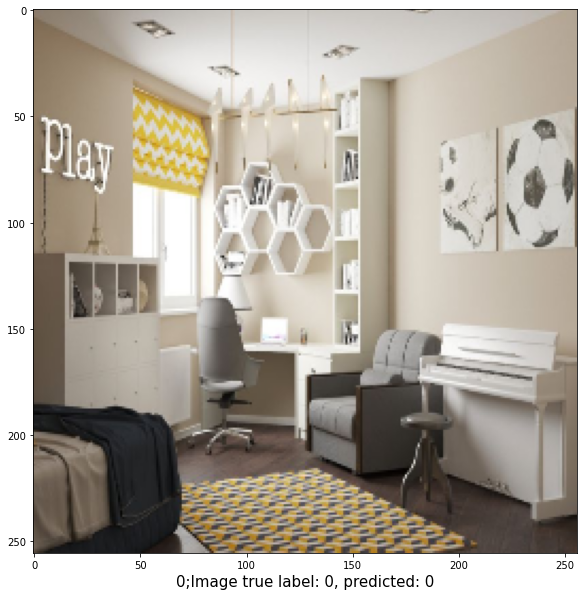

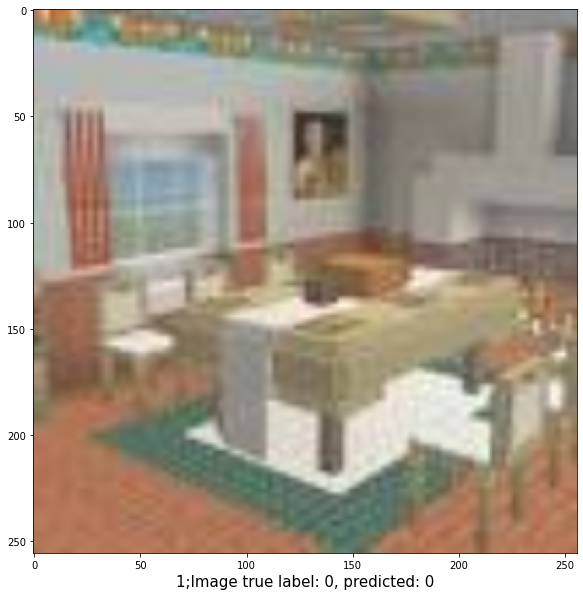

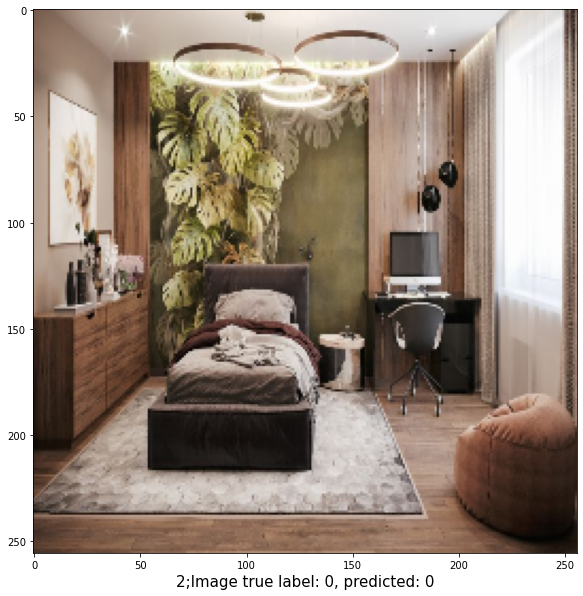

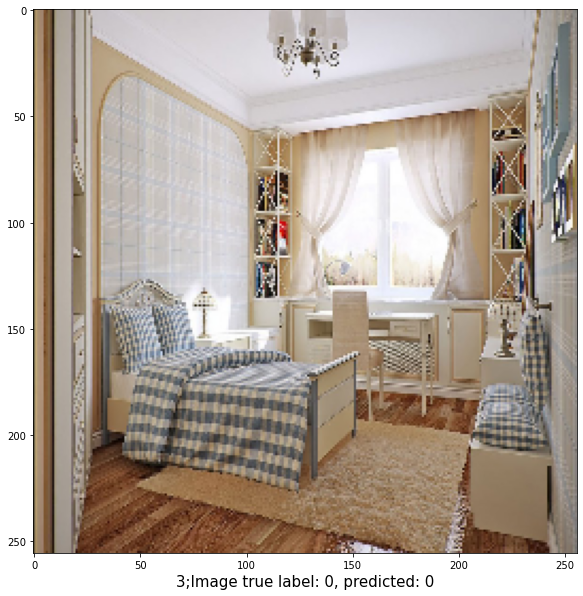

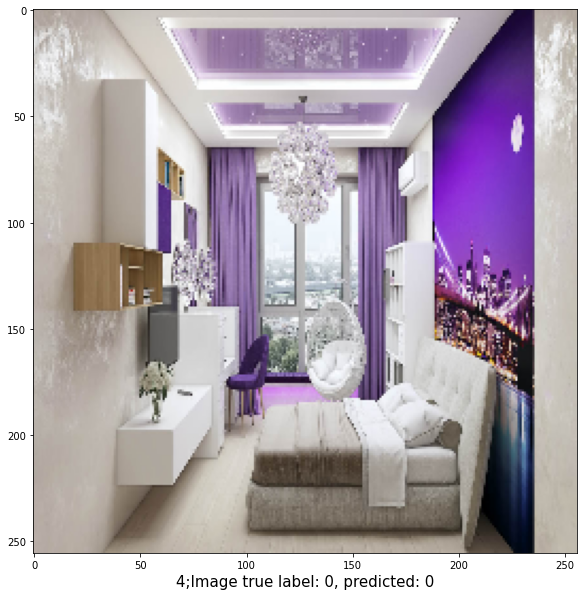

...

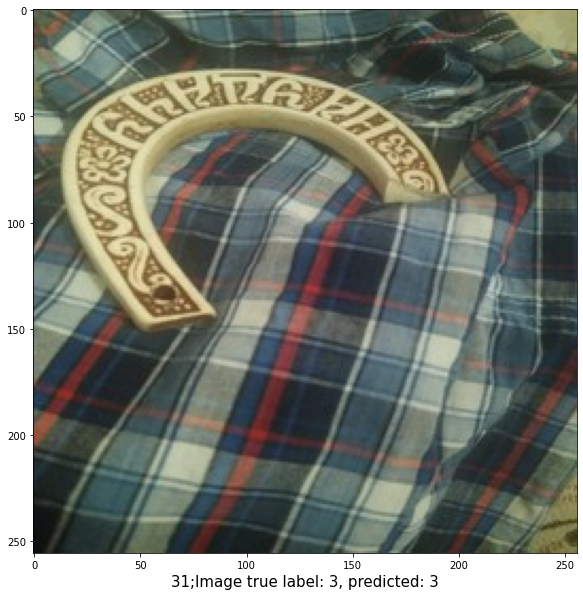

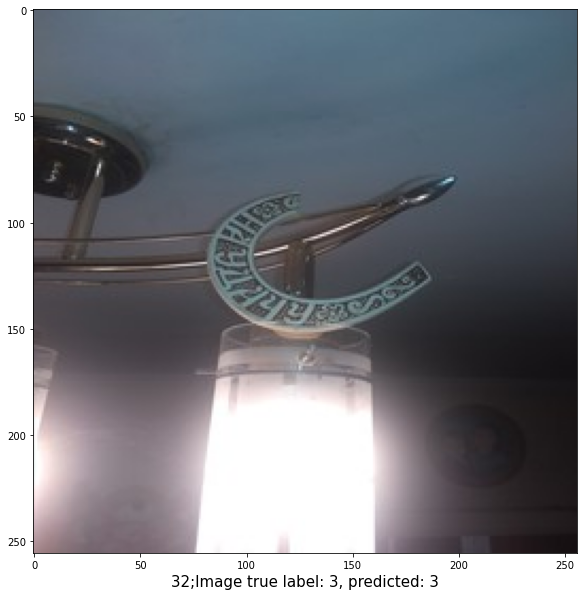

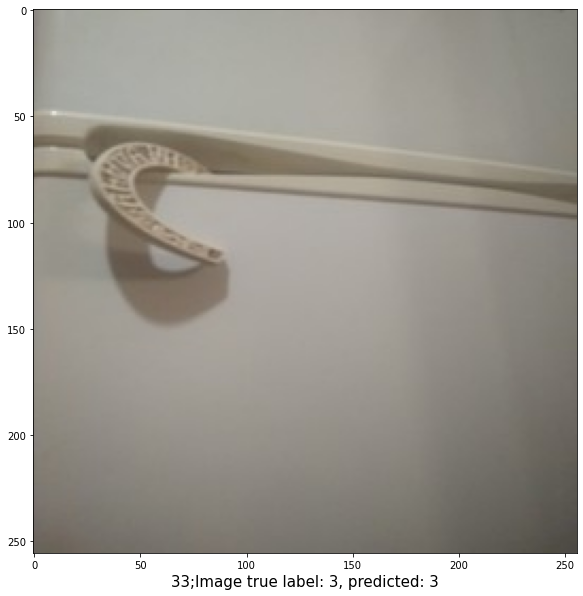

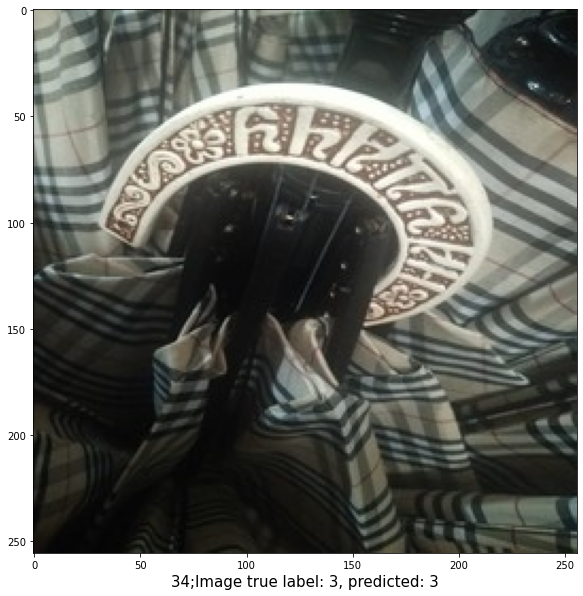

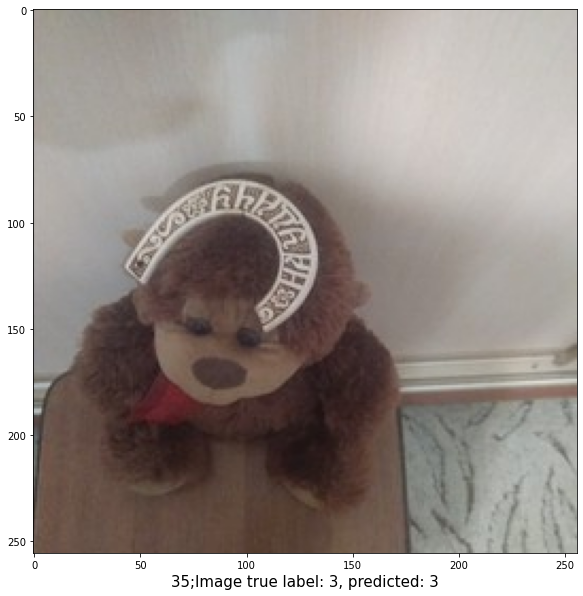

In [42]:
truth_id=[]
prediction=[]
model.eval()
all_out=[]
images,labels = next(iter(test_data_loader))
for i,img in enumerate(images):
            tl=int(labels[i].data.cpu().numpy())
            truth_id.append(tl) 
            image = list(img.unsqueeze(0).to(device))
            with torch.no_grad():
              outputs = model(image)
            all_out.append(outputs)
            print("Prediction--->")
            scores = outputs[0]['scores'].data.cpu().numpy()
            try:
              label=np.argmax(scores)
              if np.max(scores)>0.9:
                predict=outputs[0]['labels'].data.cpu().numpy()[label]
              else:
                predict=0 
            except:
              predict=0 
            #predict=outputs[0]['labels'].data.cpu().numpy()[label]
            #scores_2 = scores[scores >= 0.5]
            
            prediction.append(predict)
            fig, ax = plt.subplots(1, 1, figsize=(10,10))
            ax.imshow(img.permute(1, 2, 0).cpu().numpy())
            ax.set_xlabel(f"{i};Image true label: {tl}, predicted: {predict}", fontsize=15)
            del image,outputs,scores
            torch.cuda.empty_cache()

In [61]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
empty_y=le.fit_transform(truth_id[:10])
empty_pred=le.fit_transform(prediction[:10])
bird_y=le.fit_transform(truth_id[10:16])
bird_pred=le.fit_transform(prediction[10:16])
disc_y=le.fit_transform(truth_id[16:26])
disc_pred=le.fit_transform(prediction[16:26])
hs_y=le.fit_transform(truth_id[26:36])
hs_pred=le.fit_transform(prediction[26:36])

In [65]:
def perf_measure(y_actual, y_hat):
    FP = 0
    FN = 0

    for i in range(len(y_hat)): 
        if y_hat[i]==1 and y_actual[i]!=y_hat[i]:
           FP += 1
        if y_hat[i]==0 and y_actual[i]!=y_hat[i]:
           FN += 1

    return(FP, FN)

empy_metrics=perf_measure(empty_y,empty_pred)
bird_metrics=perf_measure(bird_y,bird_pred)
disc_metrics=perf_measure(disc_y,disc_pred)
hs_metrics=perf_measure(hs_y,hs_pred)

In [74]:
import plotly.express as px
df=pd.DataFrame({"Dataset":['empty','bird','disc','horseshoe'],'FP':[empy_metrics[0],bird_metrics[0],disc_metrics[0],hs_metrics[0]],\
                 'FN':[empy_metrics[1],bird_metrics[1],disc_metrics[1],hs_metrics[1]]})

In [75]:
df

,Dataset,FP,FN
0,empty,0,0
1,bird,0,0
2,disc,8,0
3,horseshoe,0,0
